# CRCD Detectron2 Segmentation Training Example

This example is based on the official colab tutorial of Detectron2. <br>
Here, we will show how to load the datasets, fine tune and validate the models. <br>
For further details, please check the [Detectron2 official Github Repo](https://github.com/facebookresearch/detectron2).

# Import detectron2

In [1]:
import torch, detectron2
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.version.cuda
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

torch:  2.2 ; cuda:  12.1
detectron2: 0.6


In [2]:
# Some basic setup:
# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# Loading the Dataset

In [3]:
# Adding the dataset for PCH (Permanent Cautery Hook)

# the path to the dataset
# dataset_path = '/path_to_dataset/'
dataset_path = '/home/' + os.environ.get('USERNAME') + '/dt2_dataset/kpts/dataset/'

# Folders containing the annotations and images
inst_ids = ["PCH_1", "PCH_2", "PCH_E_1"]

for inst_id in inst_ids:
    filepath = dataset_path + inst_id
    register_coco_instances(inst_id+"_train", {}, filepath + '/train.json', filepath)
    register_coco_instances(inst_id+"_test", {}, filepath + '/test.json', filepath)
    cur_metadata = MetadataCatalog.get(inst_id+"_train")
    cur_metadata.set(thing_classes = ["PCH"])
    cur_metadata.set(evaluator_type = 'coco')
    cur_metadata.set(
        keypoint_names = [
            'LeftScrewBottom', 'LeftScrewTop', 'CentralScrew', 'StartHook',
            'CentralHook', 'TipHook', 'RightScrewTop', 'RightScrewBottom'
        ]
    )
    cur_metadata.set(
        keypoint_flip_map = []
    )
    cur_metadata.set(
        keypoint_connection_rules = [
            ('LeftScrewBottom', 'LeftScrewTop', (0, 255, 0)), ('LeftScrewTop', 'CentralScrew', (0, 255, 0)),
            ('RightScrewBottom', 'RightScrewTop', (0, 255, 0)), ('RightScrewTop', 'CentralScrew', (0, 255, 0)),
            ('CentralScrew', 'StartHook', (0, 255, 0)), ('StartHook','CentralHook',(0, 255, 0)), 
            ('CentralHook','TipHook', (0, 255, 0))
        ]
    )
    cur_metadata.set(thing_colors=[(238, 130, 238)])


In [4]:
# # Adding the dataset for FBF (Fenestrated Bipolar Forceps)

# # the path to the dataset
# # dataset_path = '/path_to_dataset/'
# dataset_path = '/home/' + os.environ.get('USERNAME') + '/dt2_dataset/kpts/'

# # Folders containing the annotations and images
# inst_ids = ["FBF_1", "FBF_2", "FBF_E_1"]

# for inst_id in inst_ids:
#     # filepath = '/home/' + os.environ.get('USERNAME') + '/dt2_dataset/liver/' + fl_id
#     filepath = '/media/' + os.environ.get('USERNAME') + '/sub/dt2_dataset/kpts/' + inst_id
#     register_coco_instances(inst_id+"_train", {}, filepath + '/train.json', filepath)
#     register_coco_instances(inst_id+"_test", {}, filepath + '/test.json', filepath)
#     cur_metadata = MetadataCatalog.get(inst_id+"_train")
#     cur_metadata.set(thing_classes = ["FBF"])
#     cur_metadata.set(evaluator_type = 'coco')
#     cur_metadata.set(
#         keypoint_names = [
#             'Head', 'Edge', 'Center', 'TipLeft', 'TipRight'
#         ]
#     )
#     cur_metadata.set(
#         keypoint_flip_map = []
#     )
#     cur_metadata.set(
#         keypoint_connection_rules = [
#             ('Head', 'Edge', (0, 255, 0)), ('Edge', 'Center', (0, 255, 0)),
#             ('Center', 'TipLeft', (0, 255, 0)), ('Center', 'TipRight', (0, 255, 0))
#         ]
#     )
#     cur_metadata.set(thing_colors=[(238, 130, 238)])

To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



[10/15 15:15:18 d2.data.datasets.coco]: Loaded 2726 images in COCO format from /home/leo/dt2_dataset/kpts/dataset/PCH_E_1/train.json
/home/leo/dt2_dataset/kpts/dataset/PCH_E_1/./images/frame_000895.PNG
/home/leo/dt2_dataset/kpts/dataset/PCH_E_1/./images/frame_002606.PNG
/home/leo/dt2_dataset/kpts/dataset/PCH_E_1/./images/frame_000361.PNG
/home/leo/dt2_dataset/kpts/dataset/PCH_E_1/./images/frame_001340.PNG
/home/leo/dt2_dataset/kpts/dataset/PCH_E_1/./images/frame_001727.PNG


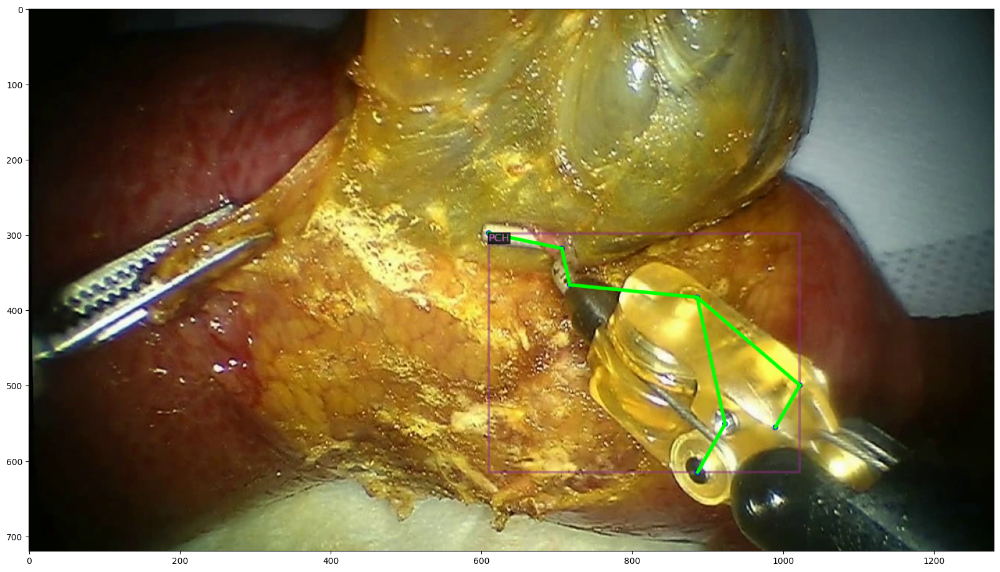

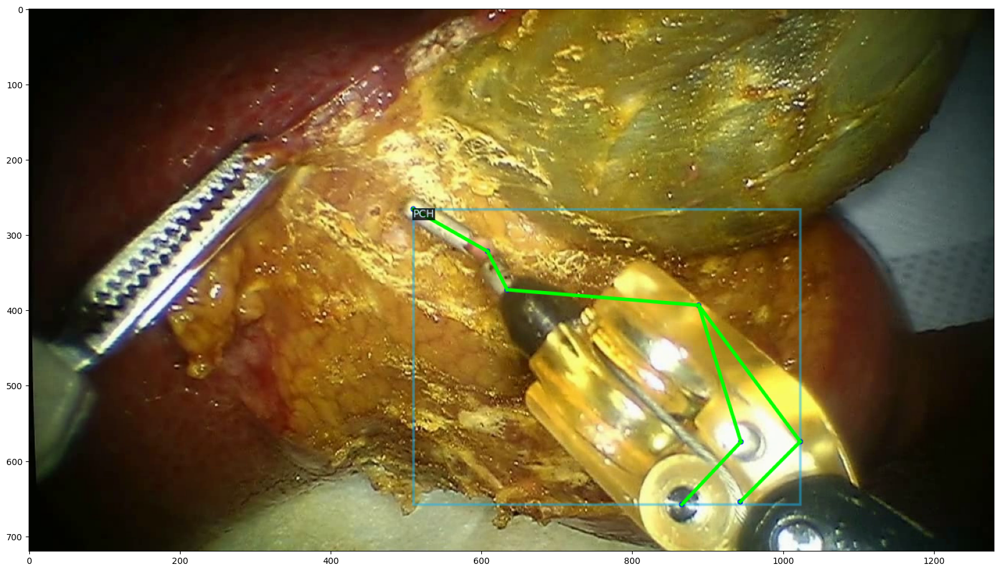

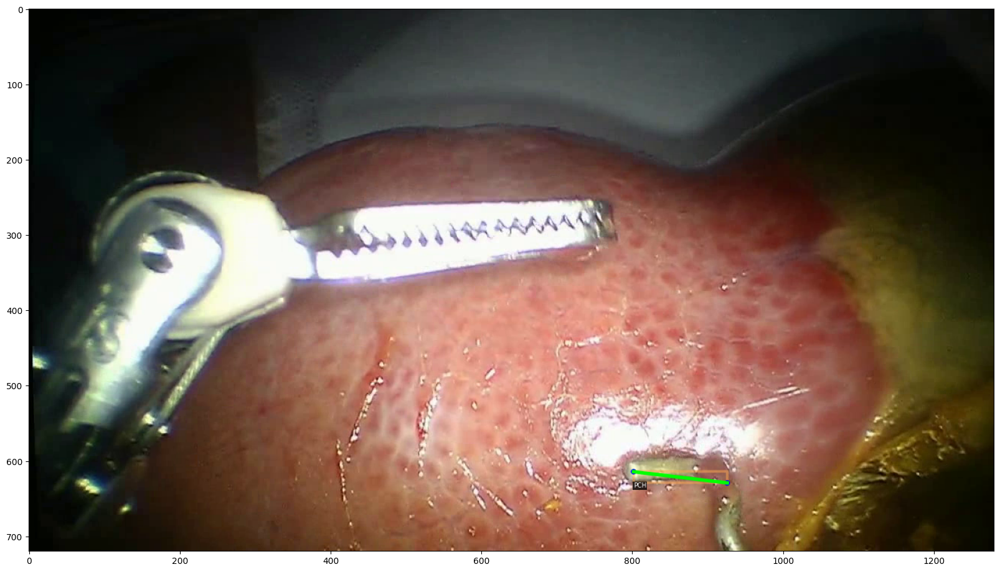

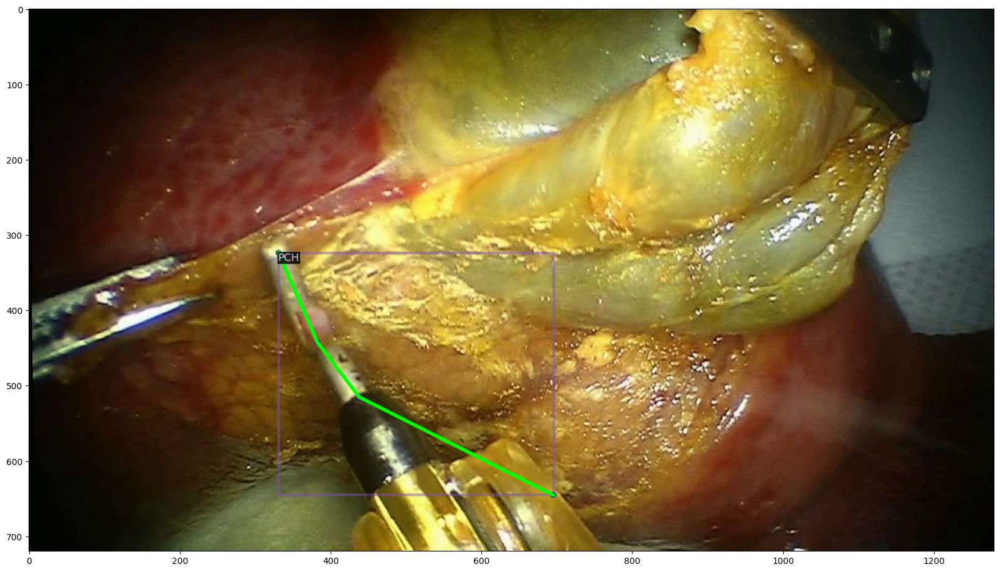

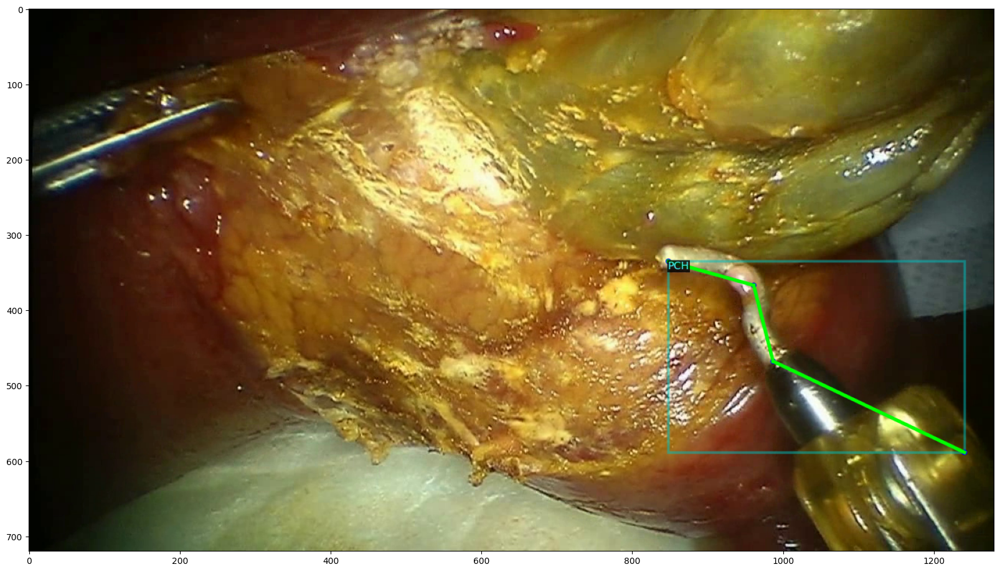

In [5]:
import matplotlib.pyplot as plt

dataset_dicts = DatasetCatalog.get(inst_ids[-1]+"_train")

for d in random.sample(dataset_dicts, 5):
    print(d['file_name'])
    img = cv2.imread(d['file_name'])
    visualizer = Visualizer(img, metadata=cur_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (20,20))
    plt.imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the dataset.


In [6]:
from detectron2.engine import DefaultTrainer

# The configuration used for the model described in the paper.
# Feel free to tune it!
# More details and options are illustrated in 
# https://detectron2.readthedocs.io/en/latest/modules/config.html#yaml-config-references

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = tuple([inst_id+"_train" for inst_id in inst_ids])
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.01
cfg.SOLVER.MAX_ITER = 10000
cfg.SOLVER.STEPS = [*range(int(cfg.SOLVER.MAX_ITER/10), cfg.SOLVER.MAX_ITER, int(cfg.SOLVER.MAX_ITER/10))]
cfg.SOLVER.GAMMA = 0.5
cfg.SOLVER.WARMUP_FACTOR = 1.0 / int(cfg.SOLVER.MAX_ITER/10)
cfg.SOLVER.WARMUP_ITERS = int(cfg.SOLVER.MAX_ITER/10)
cfg.SOLVER.WARMUP_METHOD = "linear"
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.SOLVER.CHECKPOINT_PERIOD = 5000
cfg.OUTPUT_DIR = dataset_path + '/output' # the path where the model will be saved. Make sure to modify accordingly!

# for KeyPoints Detection
cfg.MODEL.RETINANET.NUM_CLASSES = 1

# 8 for PCH, 5 for FBF (Please comment/uncomment accordingly!)
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 8
# cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 5


In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the validation dataset. First, let's create a predictor using the model we just trained:



In [11]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.DATASETS.TEST = tuple([inst_id+"_test" for inst_id in inst_ids])
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9   # set a custom testing threshold
# 68%: 0.81, 95%: 0.61, 99%: 0.32
kpt_oks_sigmas = [0.32]*cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS
cfg.TEST.KEYPOINT_OKS_SIGMAS = kpt_oks_sigmas

predictor = DefaultPredictor(cfg)

[10/15 15:18:01 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /home/leo/dt2_dataset/kpts/dataset//output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

[10/15 15:18:05 d2.data.datasets.coco]: Loaded 682 images in COCO format from /home/leo/dt2_dataset/kpts/dataset/PCH_E_1/test.json


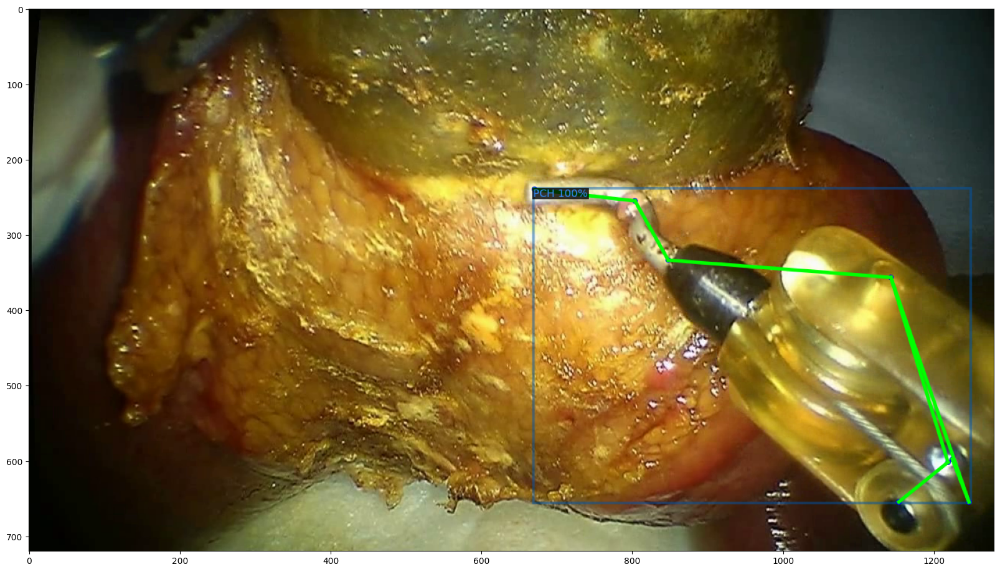

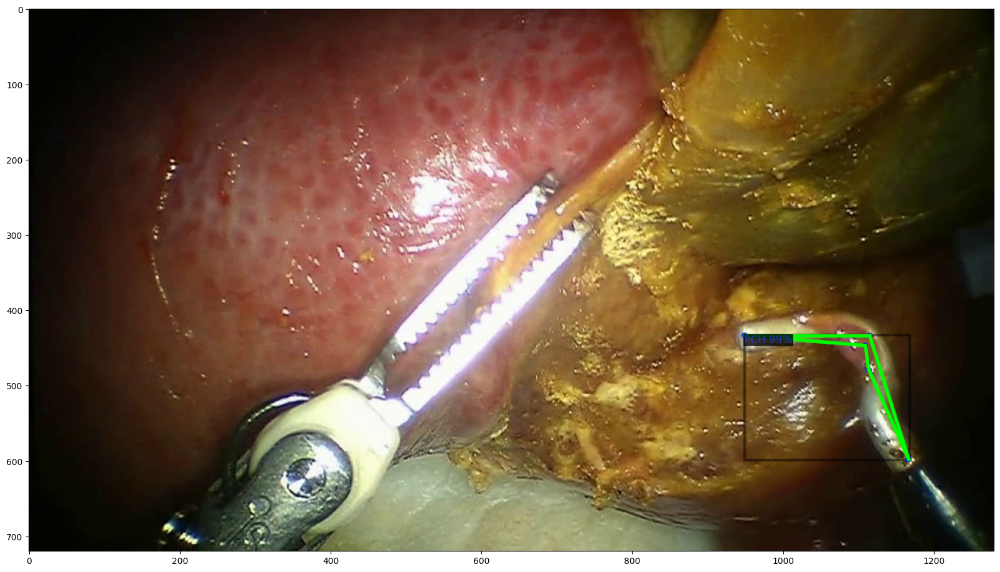

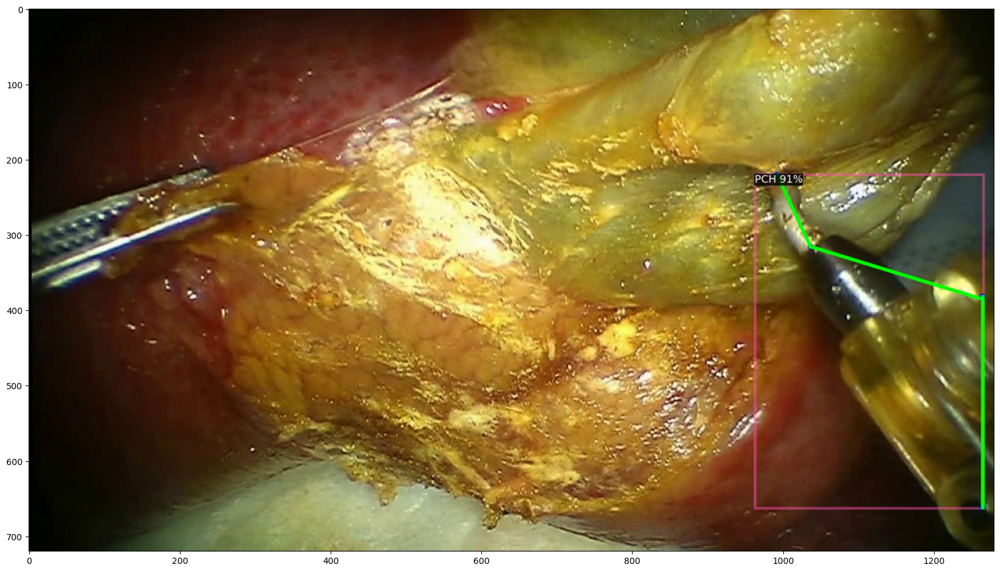

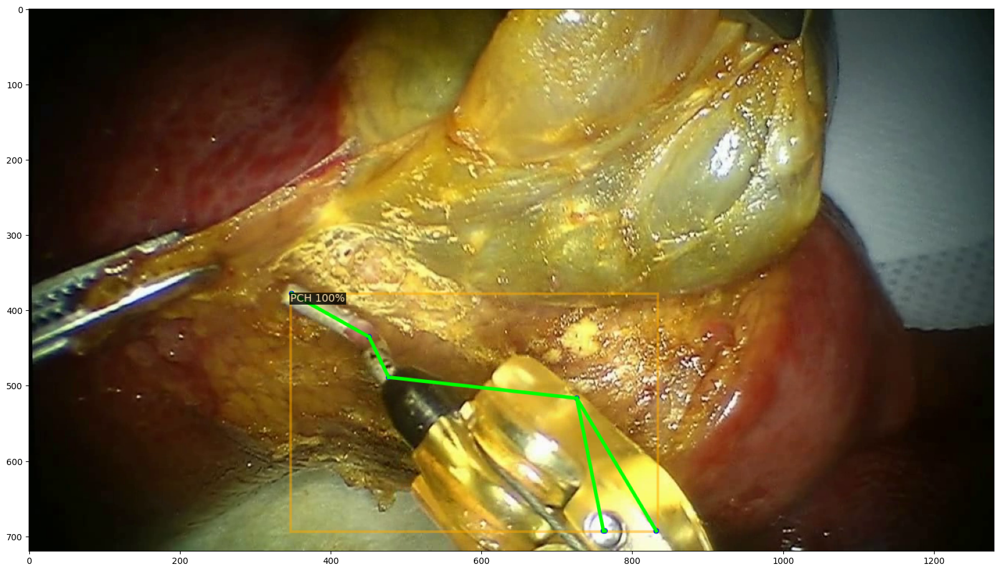

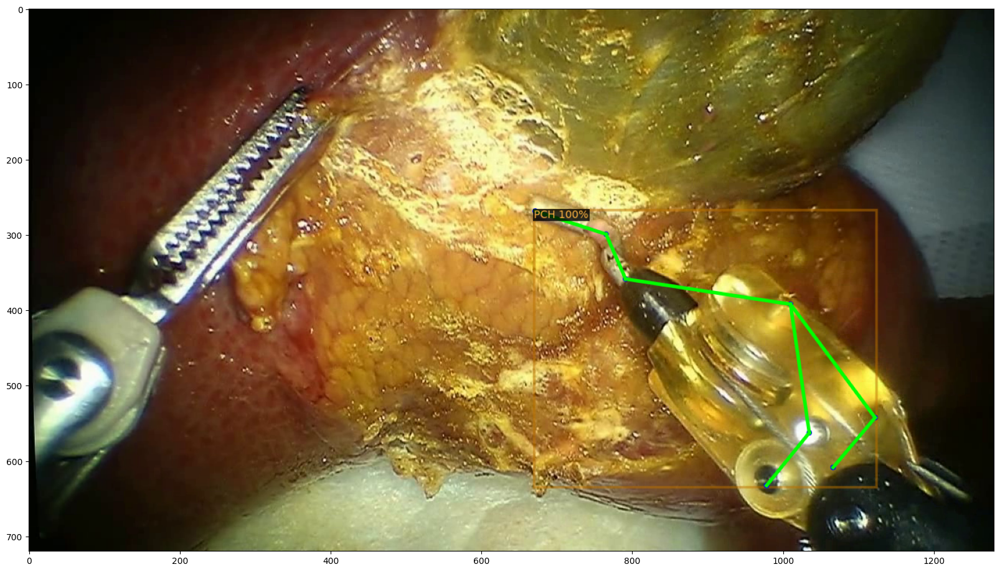

In [12]:
from detectron2.utils.visualizer import ColorMode

dataset_dicts = DatasetCatalog.get(inst_ids[-1]+"_test")

for d in random.sample(dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(
        im,
        metadata=cur_metadata, 
        scale=1.0,
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (20,20))
    plt.imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.

In [11]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

for inst_id in inst_ids:
    evaluator = COCOEvaluator(inst_id+"_test", kpt_oks_sigmas=kpt_oks_sigmas, output_dir=cfg.OUTPUT_DIR)
    val_loader = build_detection_test_loader(cfg, inst_id+"_test")
    print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/06 09:18:36 d2.data.datasets.coco]: Loaded 598 images in COCO format from /media/sitl-dvrk-sub/sub/dt2_dataset/kpts/FBF/test.json
[05/06 09:18:36 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    FBF     | 598          |
|            |              |
[05/06 09:18:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/06 09:18:36 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/06 09:18:36 d2.data.common]: Serializing 598 elements to byte tensors and concatenating them all ...
[05/06 09:18:36 d2.data.common]: Serialized dataset takes 0.23 MiB
[05/06 09:18:36 d2.evaluation.evaluator]: Start inference on 598 batches
[05/06 09:18:37 d2.evaluation.evaluator]: Inference done 11/598. Dataloading: 0.0008 s/iter. Inference: 0.0504 s/iter. Eva